In [2]:
import tensorflow as tf

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
PATH = r'/content/drive/My Drive/concatenatedTrainData/'
print('Path:',PATH)

Path: /content/drive/My Drive/concatenatedTrainData/


In [5]:
import os
print(os.listdir(PATH))

['10.png', '100.png', '101.png', '102.png', '103.png', '104.png', '105.png', '106.png', '107.png', '109.png', '110.png', '112.png', '113.png', '114.png', '115.png', '116.png', '117.png', '118.png', '119.png', '12.png', '120.png', '121.png', '122.png', '123.png', '124.png', '125.png', '126.png', '127.png', '128.png', '129.png', '13.png', '130.png', '131.png', '132.png', '135.png', '136.png', '137.png', '138.png', '139.png', '14.png', '140.png', '141.png', '142.png', '143.png', '144.png', '145.png', '147.png', '149.png', '15.png', '150.png', '151.png', '152.png', '154.png', '157.png', '159.png', '16.png', '160.png', '162.png', '167.png', '169.png', '17.png', '171.png', '172.png', '173.png', '174.png', '175.png', '176.png', '18.png', '180.png', '183.png', '184.png', '185.png', '186.png', '187.png', '188.png', '189.png', '191.png', '193.png', '194.png', '195.png', '196.png', '198.png', '199.png', '2.png', '200.png', '201.png', '202.png', '203.png', '204.png', '206.png', '207.png', '209.png

In [6]:
#Function to Load the Images
def load(image_file):
  image = tf.io.read_file(image_file)
  image = tf.image.decode_png(image)

  w = tf.shape(image)[1]

  w = w // 2
  input_image = image[:, :w, :]
  real_image = image[:, w:, :]

  input_image = tf.cast(input_image, tf.float32)
  real_image = tf.cast(real_image, tf.float32)

  return input_image, real_image

(256, 256, 3)


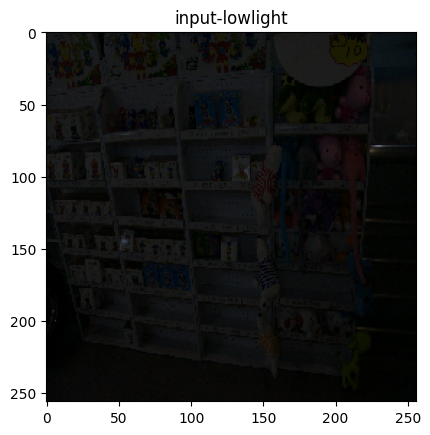

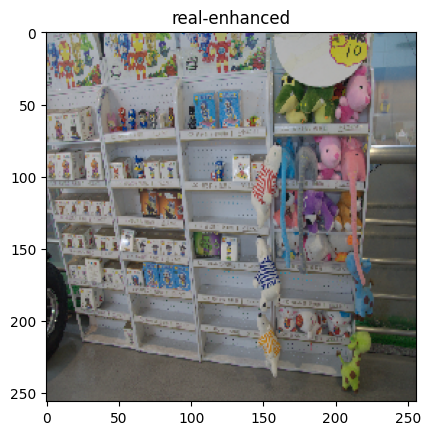

In [7]:
import matplotlib.pyplot as plt
inp, re = load(PATH+'681.png')
# casting to int for matplotlib to show the image
plt.figure()
plt.title('input-lowlight')
plt.imshow(inp/255.0)
plt.figure()
plt.title('real-enhanced')
plt.imshow(re/255.0)
print(inp.shape)

In [ ]:
BUFFER_SIZE = 400
BATCH_SIZE = 1
IMG_WIDTH = 256
IMG_HEIGHT = 256

In [8]:
# Resize Reshape Tranform Image Functions
def resize(input_image, real_image, height, width):
  input_image = tf.image.resize(input_image, [height, width],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  real_image = tf.image.resize(real_image, [height, width],
                               method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  return input_image, real_image

In [9]:
def random_crop(input_image, real_image):
  stacked_image = tf.stack([input_image, real_image], axis=0)
  cropped_image = tf.image.random_crop(
      stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])

  return cropped_image[0], cropped_image[1]

In [10]:
# normalizing the images to [-1, 1]

def normalize(input_image, real_image):
  input_image = (input_image / 127.5) - 1
  real_image = (real_image / 127.5) - 1

  return input_image, real_image

In [11]:
@tf.function()
def random_jitter(input_image, real_image):
  # resizing to 286 x 286 x 3
  input_image, real_image = resize(input_image, real_image, 286, 286)
  print(input_image.shape)

  # randomly cropping to 256 x 256 x 3
  input_image, real_image = random_crop(input_image, real_image)
  print('crop',input_image.shape)
  if tf.random.uniform(()) > 0.5:
    # random mirroring
    input_image = tf.image.flip_left_right(input_image)
    real_image = tf.image.flip_left_right(real_image)

  return input_image, real_image

As you can see in the images below that they are going through random jittering Random jittering as described in the paper is to

Resize an image to bigger height and width

Randomly crop to the target size

Randomly flip the image horizontally

(286, 286, 3)
crop (256, 256, 3)


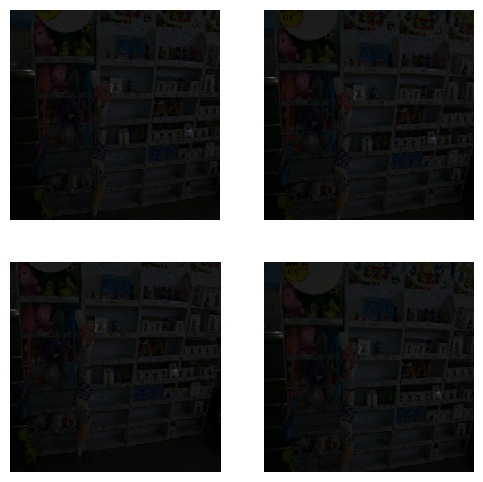

In [13]:
plt.figure(figsize=(6, 6))
for i in range(4):
  rj_inp, rj_re = random_jitter(inp, re)
  plt.subplot(2, 2, i+1)
  plt.imshow(rj_inp/255.0)
  plt.axis('off')
plt.show()

In [14]:
#Load the Train Image Set
def load_image_train(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = random_jitter(input_image, real_image)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

In [15]:
#Load the Test Image Set
def load_image_test(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = resize(input_image, real_image,
                                   IMG_HEIGHT, IMG_WIDTH)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

In [16]:
train_dataset = tf.data.Dataset.list_files(PATH+'*.png')
train_dataset = train_dataset.map(load_image_train,
                                  num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

(286, 286, None)
crop (256, 256, 3)


In [17]:
#path for test dataset
PATH_test = r'/content/drive/My Drive/concatenatedTestData/'
print('Path:',PATH_test)

Path: /content/drive/My Drive/concatenatedTestData/


In [18]:
test_dataset = tf.data.Dataset.list_files(PATH_test+'*.png')
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)

Building the Generator

In [19]:
# Generator model
# Basically a customized U-Net Architecture


def downsample(filters, size, apply_batchnorm=True):   	# Downsampling operation in encoder consist of CONV -> BatchNorm -> LeakyReLU
  initializer = tf.random_normal_initializer(0., 0.02) # tensors with mean distribution

  result = tf.keras.Sequential()
  #Convolution Part
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  #Batch Normalization Part
  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  #Leaky Relu Filter
  result.add(tf.keras.layers.LeakyReLU())

  return result


def upsample(filters, size, apply_dropout=False):		# Upsampling operation in decoder consist of TransposeConv -> BatchNorm -> Dropout
  #Initializer
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()

  #Transpose Convolutional Part
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

  #Adding Batch Normalization
  result.add(tf.keras.layers.BatchNormalization())

  #applying DropOut
  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  #Adding ReLu Filter
  result.add(tf.keras.layers.ReLU())

  return result




# Generator Model is Basically A Sequence of Downsamplings followed by Upsamplings

def Generator():										# Generator model
  inputs = tf.keras.layers.Input(shape=[256,256,3])

  down_stack = [										# Encoder
    downsample(64, 4, apply_batchnorm=False), # (bs, 128, 128, 64)
    downsample(128, 4), # (bs, 64, 64, 128)
    downsample(256, 4), # (bs, 32, 32, 256)
    downsample(512, 4), # (bs, 16, 16, 512)
    downsample(512, 4), # (bs, 8, 8, 512)
    downsample(512, 4), # (bs, 4, 4, 512)
    downsample(512, 4), # (bs, 2, 2, 512)
    downsample(512, 4), # (bs, 1, 1, 512)
  ]

  up_stack = [											# Decoder
    upsample(512, 4, apply_dropout=True), # (bs, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True), # (bs, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True), # (bs, 8, 8, 1024)
    upsample(512, 4), # (bs, 16, 16, 1024)
    upsample(256, 4), # (bs, 32, 32, 512)
    upsample(128, 4), # (bs, 64, 64, 256)
    upsample(64, 4), # (bs, 128, 128, 128)
  ]

  #initializer
  initializer = tf.random_normal_initializer(0., 0.02)

  #Last Layer of the model
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh') # (bs, 256, 256, 3)

  x = inputs

  # Downsampling through the model
  skips = []											# Skip connections between encoder and decoder
  for down in down_stack:
    x = down(x)
    skips.append(x)

  # What this part does ?
  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])		# Concatenation using skip connections

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

In [20]:
down_model = downsample(3, 4)
down_result = down_model(tf.expand_dims(inp, 0))
print (down_result.shape)

(1, 128, 128, 3)


In [21]:
up_model = upsample(3, 4)
up_result = up_model(down_result)
print (up_result.shape)

(1, 256, 256, 3)


In [22]:
OUTPUT_CHANNELS = 3

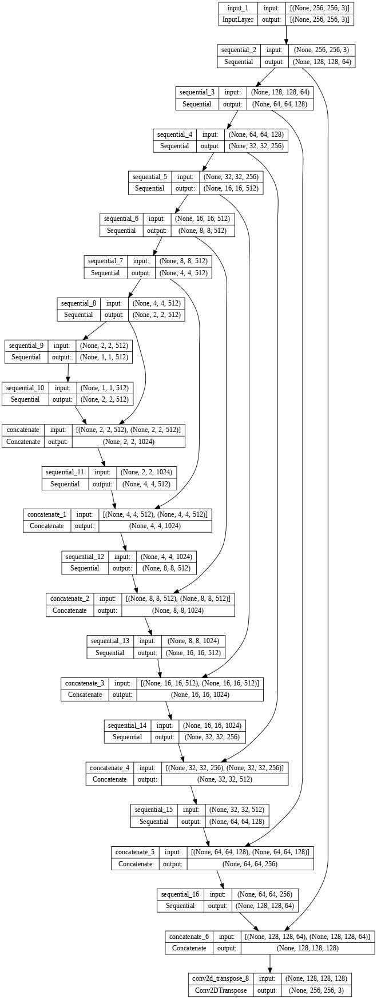

In [23]:
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

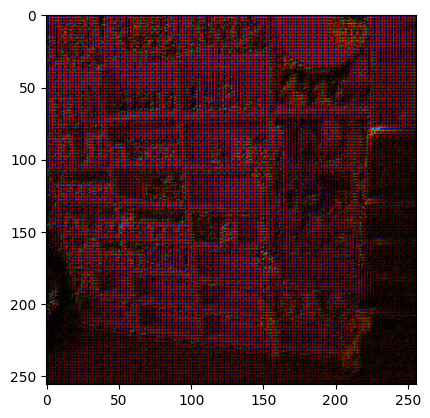

In [24]:
gen_output = generator(inp[tf.newaxis,...], training=False)
plt.imshow(gen_output[0,...])

In [25]:
LAMBDA = 30

def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss, gan_loss, l1_loss

In [26]:
# Discriminator model
# An image_classification model


def Discriminator():									# Discriminator model
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
  tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

  x = tf.keras.layers.concatenate([inp, tar]) # (bs, 256, 256, channels*2)

  down1 = downsample(64, 4, False)(x) # (bs, 128, 128, 64)
  down2 = downsample(128, 4)(down1) # (bs, 64, 64, 128)
  down3 = downsample(256, 4)(down2) # (bs, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3) # (bs, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1) # (bs, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2) # (bs, 30, 30, 1)

  return tf.keras.Model(inputs=[inp, tar], outputs=last)

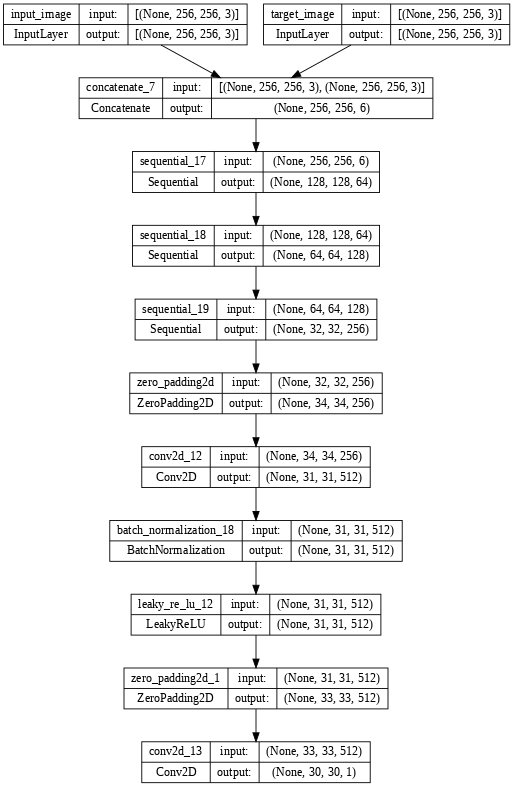

In [27]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

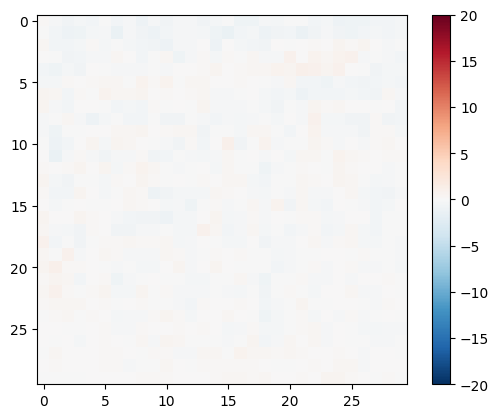

In [28]:
disc_out = discriminator([inp[tf.newaxis,...], gen_output], training=False)
plt.imshow(disc_out[0,...,-1], vmin=-20, vmax=20, cmap='RdBu_r')
plt.colorbar()

In [29]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [30]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

In [31]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [32]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

In [33]:
from math import log10, sqrt
import cv2
import numpy as np

def PSNR(original, compressed):
    mse = np.mean((0 - compressed) ** 2)
    if(mse == 0):  # MSE is zero means no noise is present in the signal .
                  # Therefore PSNR have no importance.
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr

In [34]:
def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15,15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  value = PSNR(tar[0], prediction[0])
  print(f"PSNR value is {value} dB")

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

PSNR value is 56.107133675968825 dB


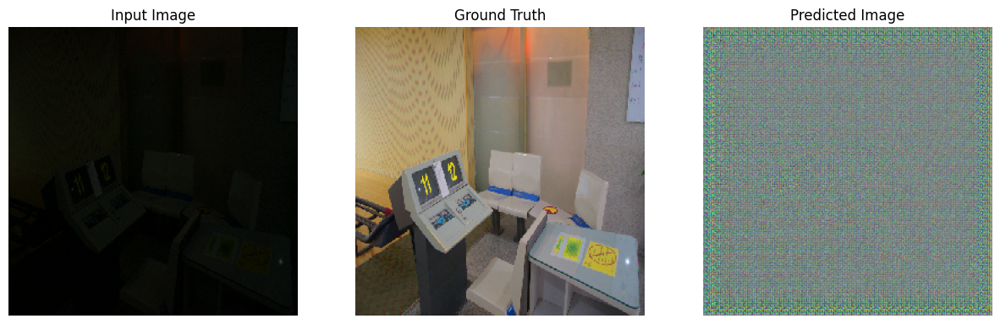

In [35]:
for example_input, example_target in test_dataset.take(1):
  generate_images(generator, example_input, example_target)

In [36]:
EPOCHS = 25
import datetime
log_dir="logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [37]:
import sys

@tf.function
def train_step(input_image, target, epoch):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)

    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

  with summary_writer.as_default():
    tf.summary.scalar('gen_total_loss', gen_total_loss, step=epoch)
    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=epoch)
    tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=epoch)
    tf.summary.scalar('disc_loss', disc_loss, step=epoch)

  return gen_total_loss, gen_gan_loss, gen_l1_loss, disc_loss

In [38]:
from tensorflow.keras.models import Sequential, save_model, load_model

In [39]:
filepath = './saved_model11'

In [40]:
import time
def fit(train_ds, epochs, test_ds):
  g_t_loss = []
  g_g_loss = []
  g_l1_loss = []
  d_loss = []

  for epoch in range(epochs):
    start = time.time()

    #display.clear_output(wait=True)

    for example_input, example_target in test_ds.take(1):
      generate_images(generator, example_input, example_target)
    print("Epoch: ", epoch+1)

    # Train
    for n, (input_image, target) in train_ds.enumerate():
      print('.', end='')
      if (n+1) % 100 == 0:
        print()
      gen_total_loss, gen_gan_loss, gen_l1_loss, disc_loss = train_step(input_image, target, epoch)
      gen_total_loss_last = float(gen_total_loss)
      gen_gan_loss_last = float(gen_gan_loss)
      gen_l1_loss_last = float(gen_l1_loss)
      disc_loss_last = float(disc_loss)
    print()
    print(f"gen_total_loss : {gen_total_loss_last}, gen_gan_loss : {gen_gan_loss_last}, gen_l1_loss : {gen_l1_loss_last}, disc_loss : {disc_loss_last}")

    g_t_loss.append(gen_total_loss_last)
    g_g_loss.append(gen_gan_loss_last)
    g_l1_loss.append(gen_l1_loss_last)
    d_loss.append(disc_loss_last)


    # saving (checkpoint) the model every 20 epochs
    # if (epoch + 1) % 50 == 0:
    #   checkpoint.save(file_prefix = checkpoint_prefix)

    print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,
                                                        time.time()-start))
  # checkpoint.save(file_prefix = checkpoint_prefix)

  return g_t_loss, g_g_loss, g_l1_loss, d_loss

PSNR value is 54.59501253257123 dB


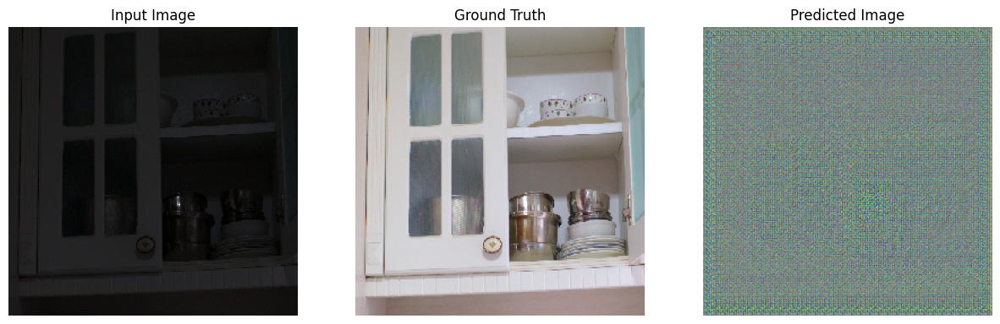

Epoch:  1
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.....................................................................................
gen_total_loss : 8.345627784729004, gen_gan_loss : 0.9275490045547485, gen_l1_loss : 0.24726928770542145, disc_loss : 0.8662744760513306
Time taken for epoch 1 is 1430.0308108329773 sec

PSNR value is 62.17209355297445 dB


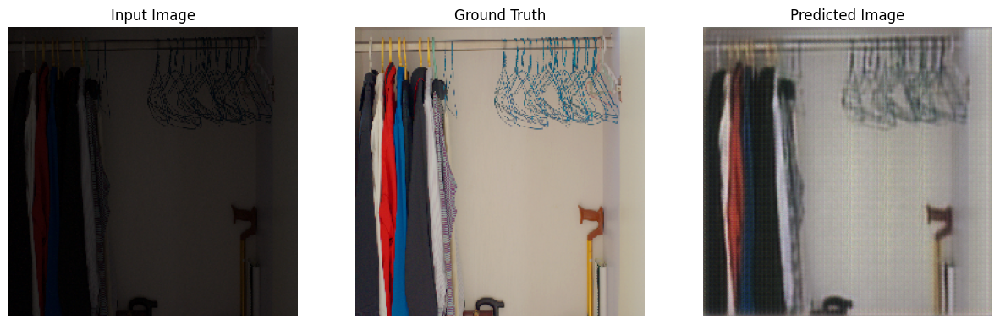

Epoch:  2
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.....................................................................................
gen_total_loss : 4.644270896911621, gen_gan_loss : 1.0642282962799072, gen_l1_loss : 0.11933475732803345, disc_loss : 1.4220529794692993
Time taken for epoch 2 is 1401.5231788158417 sec

PSNR value is 59.18164732086906 dB


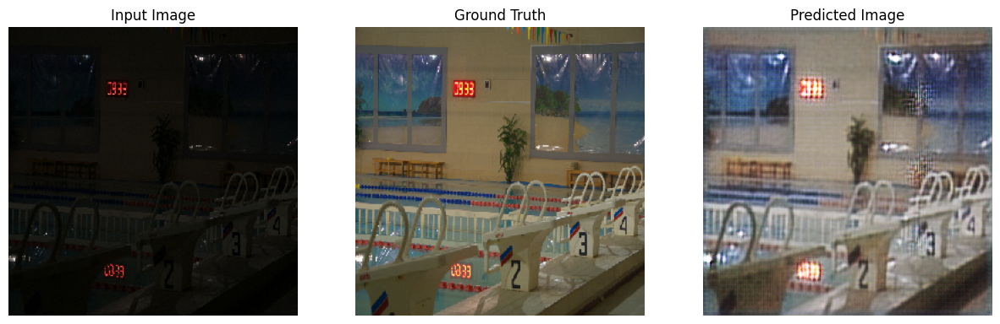

Epoch:  3
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.....................................................................................
gen_total_loss : 4.381417274475098, gen_gan_loss : 1.254098892211914, gen_l1_loss : 0.10424395650625229, disc_loss : 1.2662442922592163
Time taken for epoch 3 is 1396.9450783729553 sec

PSNR value is 61.032400744817636 dB


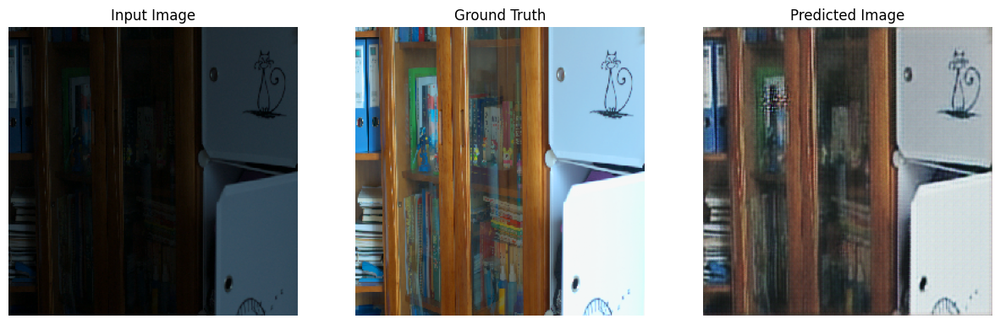

Epoch:  4
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.....................................................................................
gen_total_loss : 7.903824806213379, gen_gan_loss : 1.2322783470153809, gen_l1_loss : 0.22238488495349884, disc_loss : 0.6531169414520264
Time taken for epoch 4 is 1414.4539606571198 sec

PSNR value is 64.78864850647051 dB


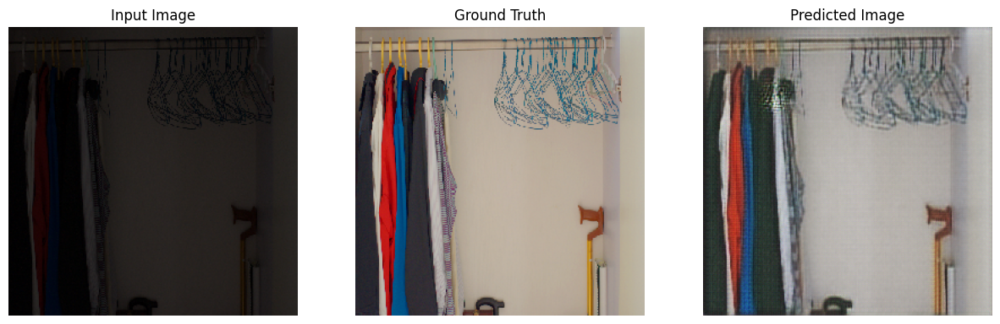

Epoch:  5
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.....................................................................................
gen_total_loss : 10.842159271240234, gen_gan_loss : 1.085917353630066, gen_l1_loss : 0.32520806789398193, disc_loss : 0.5969647765159607
Time taken for epoch 5 is 1431.065767288208 sec

PSNR value is 59.96357630651367 dB


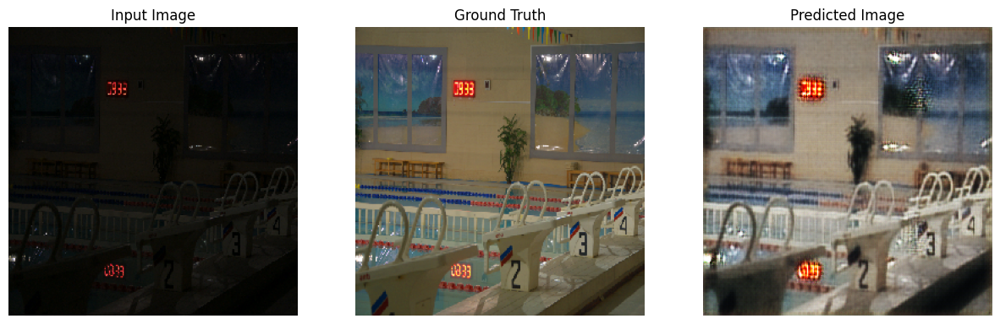

Epoch:  6
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.....................................................................................
gen_total_loss : 3.7983572483062744, gen_gan_loss : 0.4426172077655792, gen_l1_loss : 0.11185800284147263, disc_loss : 1.2523272037506104
Time taken for epoch 6 is 1430.7189486026764 sec

PSNR value is 56.00861902120997 dB


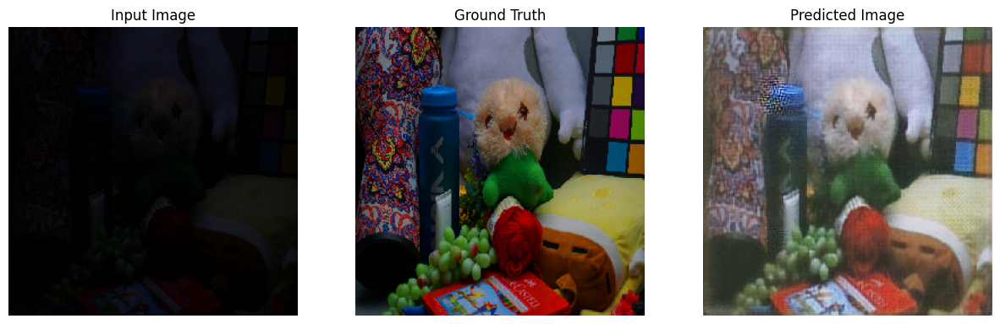

Epoch:  7
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.....................................................................................
gen_total_loss : 4.395334720611572, gen_gan_loss : 1.0408776998519897, gen_l1_loss : 0.11181523650884628, disc_loss : 1.1052896976470947
Time taken for epoch 7 is 1466.86483502388 sec

PSNR value is 59.580090745596486 dB


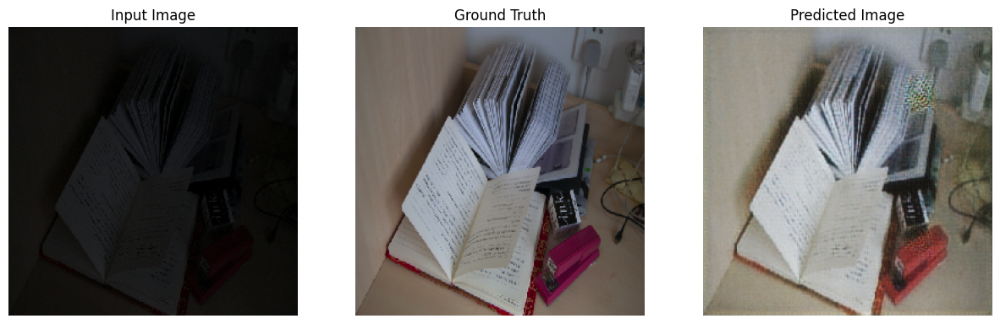

Epoch:  8
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.....................................................................................
gen_total_loss : 4.389955520629883, gen_gan_loss : 0.7820558547973633, gen_l1_loss : 0.12026331573724747, disc_loss : 1.0473072528839111
Time taken for epoch 8 is 1449.6448271274567 sec

PSNR value is 56.87691225246951 dB


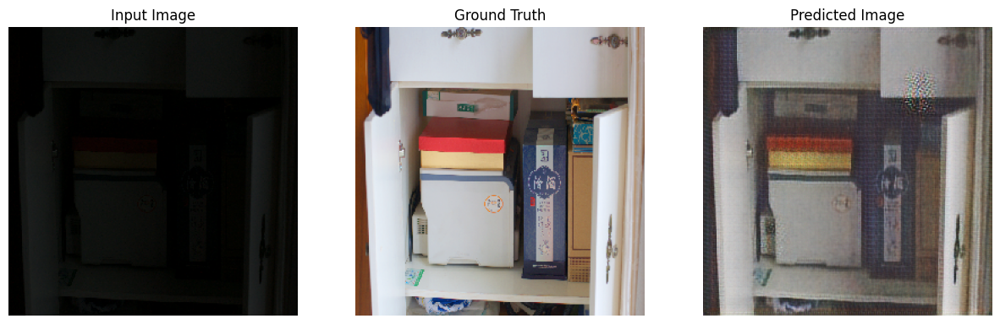

Epoch:  9
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.....................................................................................
gen_total_loss : 5.504787921905518, gen_gan_loss : 0.7500070333480835, gen_l1_loss : 0.15849269926548004, disc_loss : 0.8610742688179016
Time taken for epoch 9 is 1446.9737603664398 sec

PSNR value is 61.11365841079235 dB


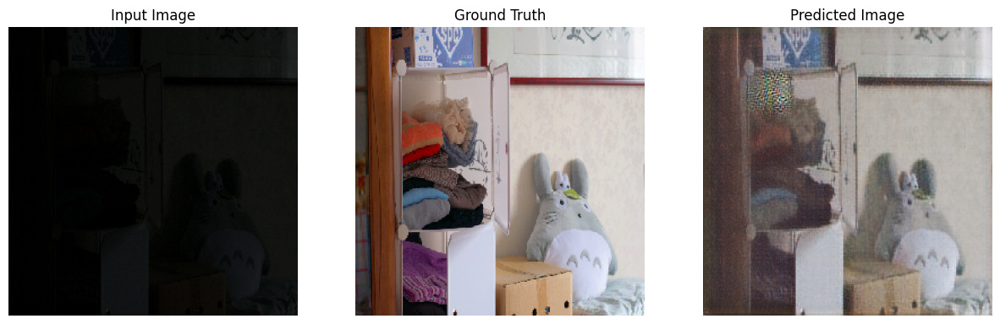

Epoch:  10
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.....................................................................................
gen_total_loss : 8.869935989379883, gen_gan_loss : 1.3227972984313965, gen_l1_loss : 0.25157129764556885, disc_loss : 0.6752985715866089
Time taken for epoch 10 is 1440.0102047920227 sec

PSNR value is 59.11414299930996 dB


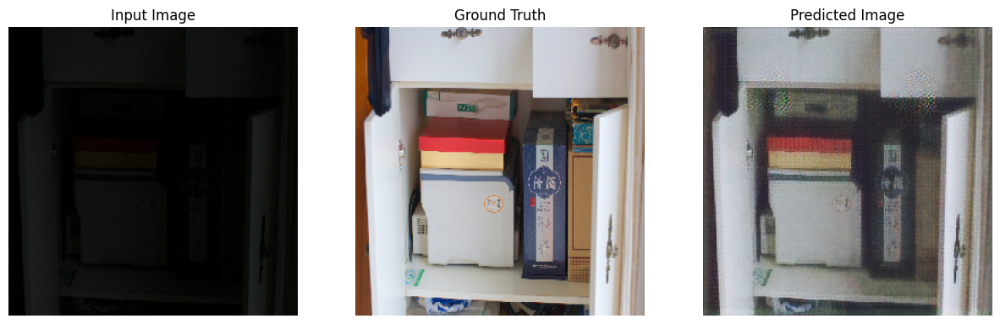

Epoch:  11
....................................................................................................
....................................................................................................
............

In [ ]:
g_t_loss, g_g_loss, g_l1_loss, d_loss = fit(train_dataset, 25, test_dataset)

In [ ]:
!ls {checkpoint_dir}

In [ ]:
# Run the trained model on a few examples from the test dataset
for inp, tar in test_dataset.take(5):
  generate_images(generator, inp, tar)